# X-rays Project
image classification


In [ ]:
import pandas as pd
import numpy as np
import os
from random import shuffle
from tqdm import tqdm
import glob
from pathlib import Path
import cv2

import matplotlib.pyplot as plt
%matplotlib inline

# Load dataset

In [ ]:
!pip install -U -q kaggle

from google.colab import files
files.upload()

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia

In [ ]:
#take a look at the directory
!ls

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip chest-xray-pneumonia.zip

In [ ]:
!unzip chest_xray.zip

In [ ]:
!ls chest_xray

the photos are in the 3 folders: test,  train,  val. which have 2 subfolders each: NORMAL,	PNEUMONIA

In [ ]:
path = '/content/drive/MyDrive/dataset5/CovidDAtaSet/Data/test/PNEUMONIA'
print(len([f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))]))

1


# Display X-rays

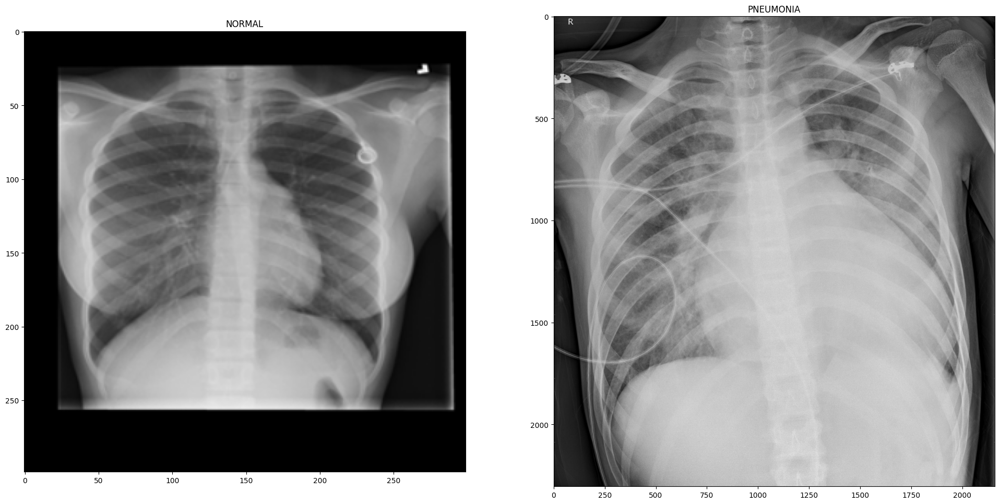

In [ ]:
plt.rcParams['figure.figsize'] = (24.0, 12.0)
plt.subplots_adjust(wspace=0.2, hspace=0)
plt.subplot(1, 2, 1).set_title('NORMAL')
plt.imshow(cv2.imread('/content/drive/MyDrive/dataset5/CovidDAtaSet/Data/val/NORMAL/Normal-1.png'))
plt.subplot(1, 2, 2).set_title('PNEUMONIA')
plt.imshow(cv2.imread('/content/drive/MyDrive/dataset5/CovidDAtaSet/Data/test/PNEUMONIA/PNEUMONIA(3781).jpg'));

In [ ]:
def prnt_imgs(path, label):
  print(label)
  multipleImages = glob.glob(path)
  i_ = 0
  plt.rcParams['figure.figsize'] = (16.0, 16.0)
  plt.subplots_adjust(wspace=0, hspace=0)
  for l in multipleImages[:25]:
      im = cv2.imread(l)
      im = cv2.resize(im, (128, 128))
      plt.subplot(5, 5, i_+1) #.set_title(l)
      plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB));
      plt.axis('off')
      i_ += 1


Normal


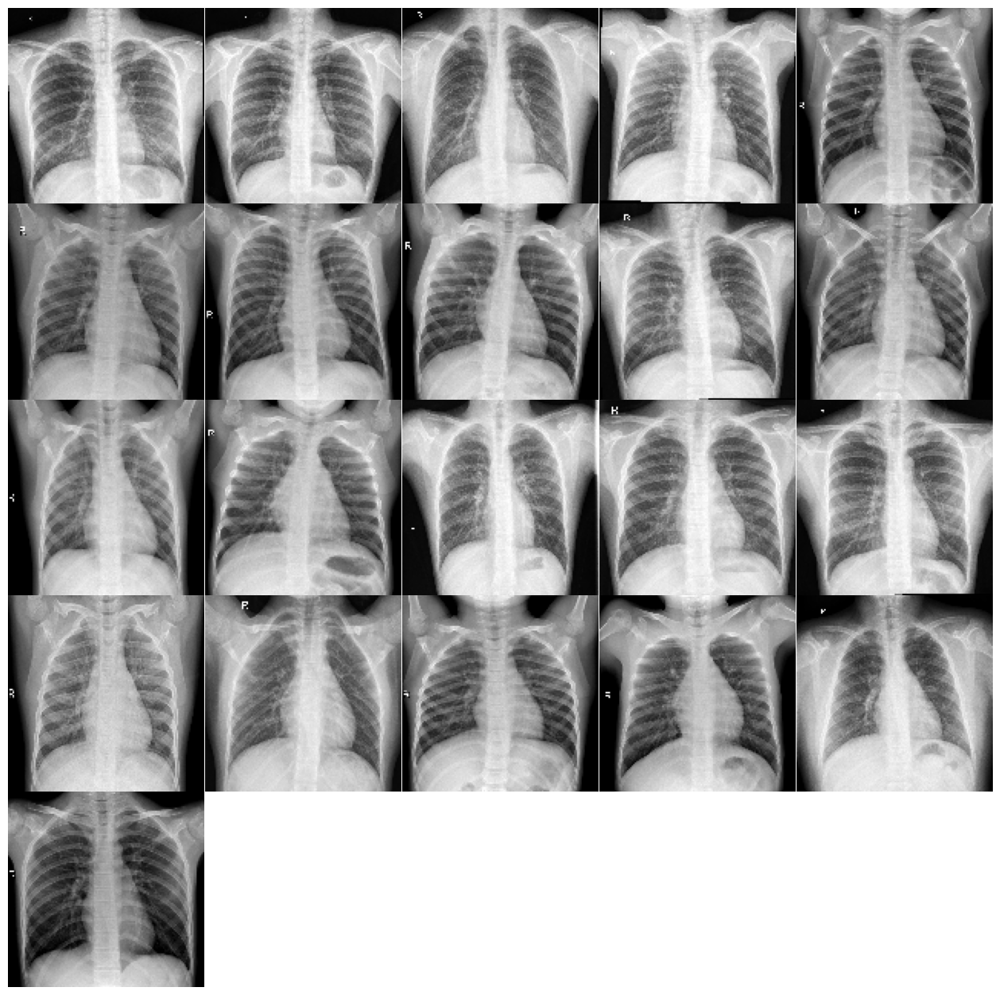

In [ ]:
prnt_imgs('/content/drive/MyDrive/dataset5/CovidDAtaSet/Data/test/NORMAL/**', "Normal")

Pneumonia


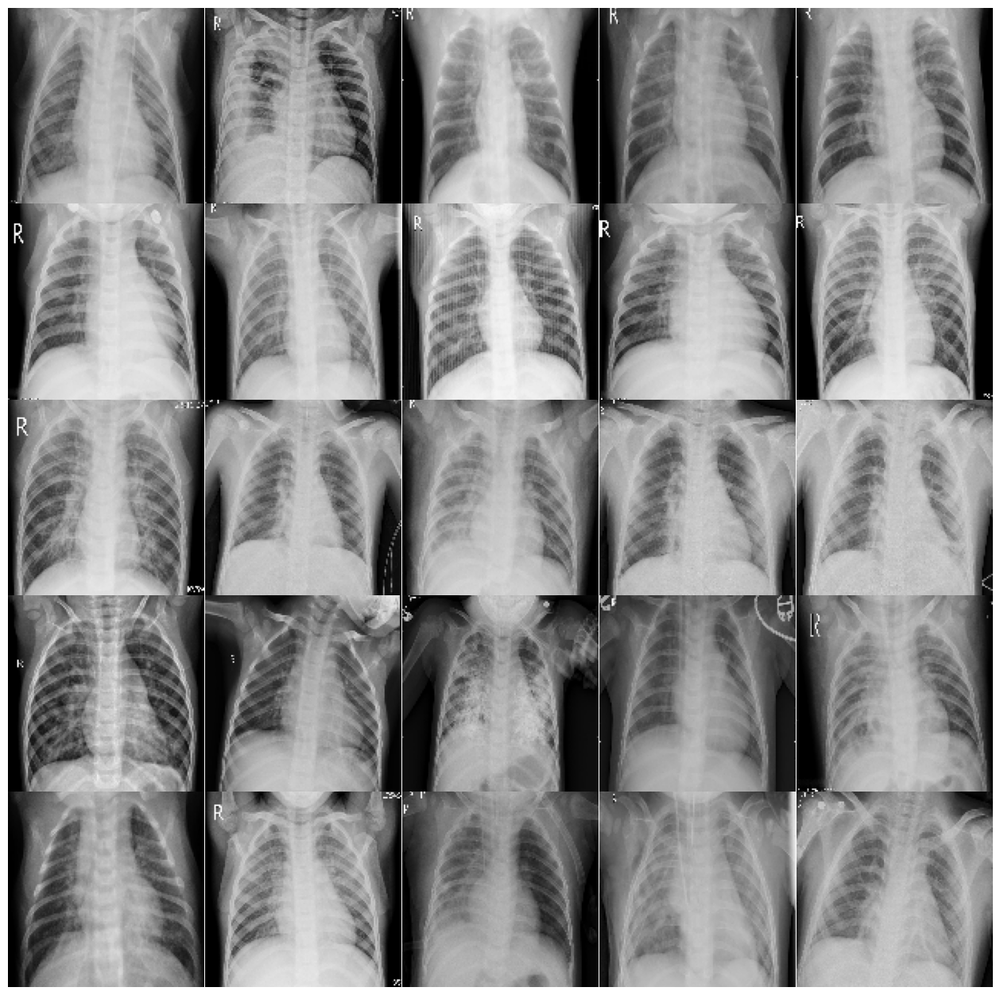

In [ ]:
prnt_imgs('/content/drive/MyDrive/dataset5/CovidDAtaSet/Data/train/PNEUMONIA/**', "Pneumonia")

## Process the images


In [ ]:
!pip install tensorflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import keras
from keras import backend as K
from keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.layers import BatchNormalization
from keras.applications import MobileNet
import keras.utils as image
from keras.applications.mobilenet import preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Model
from keras.optimizers import Adam, Adamax
from keras.callbacks import ReduceLROnPlateau , ModelCheckpoint

In [ ]:
#included in our dependencies
train_datagen=ImageDataGenerator(preprocessing_function=preprocess_input,
                                 zoom_range=0.1,
                                 horizontal_flip=False)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)#(rescale=1./255)

In [ ]:
# this is where you specify the path to the main data folder
train_generator=train_datagen.flow_from_directory(
    '/content/drive/MyDrive/dataset5/CovidDAtaSet/Data/train/',
    target_size=(224,224),
    color_mode='rgb',
    batch_size=32,
    class_mode='categorical',
    shuffle=True)

validation_generator = test_datagen.flow_from_directory(
    '/content/drive/MyDrive/dataset5/CovidDAtaSet/Data/test/',
    target_size=(224,224),
    color_mode='rgb',
    batch_size=32,
    class_mode='categorical',
    shuffle=False)

Found 1626 images belonging to 2 classes.
Found 22 images belonging to 2 classes.


# Model
Fine Tuning MobileNet

In [ ]:
K.clear_session()

In [ ]:
lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              min_delta=0.0001, patience=1, verbose=1)

In [ ]:
filepath="weights.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_loss',
                             verbose=1, save_best_only=True, mode='min')

In [ ]:
#from keras.applications.mobilenet_v2 import MobileNetV2
#base_model = MobileNetV2(weights='imagenet',include_top=False)

#imports the mobilenet model and discards the last 1000 neuron layer.
base_model = MobileNet(weights='imagenet',include_top=False)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(rate=1-0.5)(x)
#x = Dense(512, kernel_regularizer='l2', kernel_initializer='he_normal', activation='relu')(x)
#x = BatchNormalization()(x)
#x = Dropout(rate=1-0.5)(x)
x = Dense(256, kernel_regularizer='l2', kernel_initializer='he_normal', activation='relu')(x)
x = Dropout(rate=1-0.5)(x)
preds = Dense(2, activation='softmax')(x) #final layer with softmax activation

17225924/17225924 [==============================] - 0s 0us/step


Insert a batch normalization layer between convolution and activation layers and do note use dropout to conv layers [(source)](http://cs231n.stanford.edu/slides/2017/cs231n_2017_lecture6.pdf)

In [ ]:
model = Model(inputs=base_model.input, outputs=preds)

In [ ]:
print('the network has {} layers'.format(len(model.layers)))

the network has 91 layers


We freeze the first 65, because we want to maintain the abstract shapes that MobileNet has learned from imagenet dataset

In [ ]:
model.layers[53:] # 65layers: val_loss: 0.3193 - val_acc: 0.8885
#model.layers[34:] #try to train more layers  34

In [ ]:
for layer in model.layers[:53]:
    layer.trainable=False
for layer in model.layers[53:]:
    layer.trainable=True

In [ ]:
opt = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0001, amsgrad=False)
#opt = Adamax(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0)
model.compile(optimizer=opt,
              loss='categorical_crossentropy',
              metrics=['accuracy'])
# Adam optimizer
# loss function will be categorical cross entropy
# evaluation metric will be accuracy

/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 conv1 (Conv2D)              (None, None, None, 32)    864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, None, None, 32)   128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, None, None, 32)    0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, None, None, 32)   288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, None, None, 32)   128       
 ation)                                                      

In [ ]:
step_size_train = train_generator.n//train_generator.batch_size
step_size_val = validation_generator.n//validation_generator.batch_size

history = model.fit_generator(generator=train_generator,
                              validation_data=validation_generator,
                              steps_per_epoch=step_size_train,
                              validation_steps=step_size_val,
                              callbacks=[lr_reduce,checkpoint],
                              epochs=10)

<ipython-input-80-faeebb6b194c>:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(generator=train_generator,


Epoch 1/10
50/50 [==============================] - ETA: 0s - loss: 3.9888 - accuracy: 0.9630

50/50 [==============================] - 67s 1s/step - loss: 3.9888 - accuracy: 0.9630 - lr: 0.0010
Epoch 2/10
50/50 [==============================] - ETA: 0s - loss: 1.9228 - accuracy: 0.9925

50/50 [==============================] - 53s 1s/step - loss: 1.9228 - accuracy: 0.9925 - lr: 0.0010
Epoch 3/10
50/50 [==============================] - ETA: 0s - loss: 1.0150 - accuracy: 0.9931

50/50 [==============================] - 52s 1s/step - loss: 1.0150 - accuracy: 0.9931 - lr: 0.0010
Epoch 4/10
50/50 [==============================] - ETA: 0s - loss: 0.5953 - accuracy: 0.9950

50/50 [==============================] - 51s 1s/step - loss: 0.5953 - accuracy: 0.9950 - lr: 0.0010
Epoch 5/10
50/50 [==============================] - ETA: 0s - loss: 0.3593 - accuracy: 0.9950

50/50 [==============================] - 52s 1s/step - loss: 0.3593 - accuracy: 0.9950 - lr: 0.0010
Epoch 6/10
50/50 [==============================] - ETA: 0s - loss: 0.2162 - accuracy: 0.9981

50/50 [==============================] - 52s 1s/step - loss: 0.2162 - accuracy: 0.9981 - lr: 0.0010
Epoch 7/10
50/50 [==============================] - ETA: 0s - loss: 0.1349 - accuracy: 0.9987

50/50 [==============================] - 52s 1s/step - loss: 0.1349 - accuracy: 0.9987 - lr: 0.0010
Epoch 8/10
50/50 [==============================] - ETA: 0s - loss: 0.0888 - accuracy: 0.9975

50/50 [==============================] - 51s 1s/step - loss: 0.0888 - accuracy: 0.9975 - lr: 0.0010
Epoch 9/10
50/50 [==============================] - ETA: 0s - loss: 0.0591 - accuracy: 0.9981

50/50 [==============================] - 53s 1s/step - loss: 0.0591 - accuracy: 0.9981 - lr: 0.0010
Epoch 10/10
50/50 [==============================] - ETA: 0s - loss: 0.0369 - accuracy: 1.0000

50/50 [==============================] - 52s 1s/step - loss: 0.0369 - accuracy: 1.0000 - lr: 0.0010


In [ ]:
plt.rcParams['figure.figsize'] = (10.0, 6.0)
plt.plot(history.history['accuracy'])
# plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

The network is clearly overfitting after 2nd epoch, thus we saved the weights of the epoch with the lowerst validation error

In [ ]:
model.load_weights('/content/drive/MyDrive/IPD NOTES/grad_update.h5')

In [ ]:
model.save("grad_update.h5")

In [ ]:
def categorical_smooth_loss(y_true, y_pred, label_smoothing=0.1):
        loss = tf.keras.losses.categorical_crossentropy(y_true, y_pred, label_smoothing=label_smoothing)
        return loss

model = load_model("/content/drive/MyDrive/IPD NOTES/grad_cam_model.h5", custom_objects={'categorical_smooth_loss': categorical_smooth_loss})

# Confusion Matrix

In [ ]:
def proc_img(img_path):
  # process the image
  # `img` is a PIL image of size 224x224
  img = image.load_img(img_path, target_size=(224, 224))

  # `x` is a float32 Numpy array of shape (224, 224, 3)
  x_img = image.img_to_array(img)

  # We add a dimension to transform our array into a matrix
  # of size (1, 224, 224, 3)
  x_img = np.expand_dims(x_img, axis=0)

  # Finally we preprocess the batch
  # (this does channel-wise color normalization)
  #x_img = preprocess_input(x_img)
  x_img = preprocess_input(x_img)
  return x_img

In [ ]:
test_path = Path('/content/drive/MyDrive/dataset5/CovidDAtaSet/Data/test')

# Get the path to the normal and pneumonia sub-directories
normal_cases_dir = test_path / 'NORMAL'
pneumonia_cases_dir = test_path / 'PNEUMONIA'

# Get the list of all the images
normal_cases = normal_cases_dir.glob('*.jpeg')
pneumonia_cases = pneumonia_cases_dir.glob('*.jpeg')

# An empty list. We will insert the data into this list in (img_path, label) format
test_data = []

# Go through all the normal cases. The label for these cases will be 0
for img in normal_cases:
    test_data.append((img,0))

# Go through all the pneumonia cases. The label for these cases will be 1
for img in pneumonia_cases:
    test_data.append((img, 1))

# Get a pandas dataframe from the data we have in our list
test_data = pd.DataFrame(test_data, columns=['image', 'label'], index=None)

# Shuffle the data
test_data = test_data.sample(frac=1.).reset_index(drop=True)

In [ ]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 0 entries
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   0 non-null      object
 1   label   0 non-null      object
dtypes: object(2)
memory usage: 124.0+ bytes


In [ ]:
test_data.head()

,image,label


In [ ]:
x_test = np.zeros((624, 224, 224, 3))
i = 0
for l in test_data['image']:
  im_path = './'+np.str(l)
  x_test[i] = np.asarray(proc_img(im_path))
  i+=1

y_test_true = np.asarray(test_data['label'])

In [ ]:
from keras.models import load_model
model = load_model("/content/drive/MyDrive/IPD NOTES/grad_update.h5")

In [ ]:
y_test_pred = np.argmax(model.predict(x_test), axis=1)

20/20 [==============================] - 2s 46ms/step


In [ ]:
from sklearn.metrics import confusion_matrix

def recall(y_true, y_pred):
  cm  = confusion_matrix(y_true, y_pred)
  tn, fp, fn, tp = cm.ravel()
  return tp/(tp+fn)


def precision(y_true, y_pred):
  cm  = confusion_matrix(y_true, y_pred)
  tn, fp, fn, tp = cm.ravel()
  return tp/(tp+fp)

In [ ]:
from mlxtend.plotting import plot_confusion_matrix
cm  = confusion_matrix(y_test_true, y_test_pred)
plt.figure()
plot_confusion_matrix(cm,figsize=(12,8), hide_ticks=True,cmap=plt.cm.Blues)
plt.xticks(range(2), ['Normal', 'Pneumonia'], fontsize=16)
plt.yticks(range(2), ['Normal', 'Pneumonia'], fontsize=16)
plt.show()

ValueError: ignored

In [ ]:
recall(y_test_true, y_test_pred)

In [ ]:
precision(y_test_true, y_test_pred)

0.8471615720524017

In [ ]:
import tensorflow as tf

In [ ]:
from keras.models import load_model

# Visualizing heatmaps of class activation USing GradCam

In [ ]:
def prnt_out(x_img):
  model = load_model("/content/drive/MyDrive/IPD NOTES/grad_update.h5")
  "prints the probability that the model predict with its label"
  pred = model.predict(x_img)
  if pred[0,0] >= 0.5:
      print('Our network is {:.2%} sure this is NORMAL'.format(pred[0][0]))
  else:
      print('Our network is {:.2%} sure this is PNEUMONIA'.format(1-pred[0][0]))

In [ ]:
"""To visualize which parts of the image are the most important for the each
label for the classifier, let’s set up the Grad-CAM process."""



def get_img_array(img_path, size):
    img_arr = cv2.imread(img_path)
    img_arr = crop_brain_contour(img_arr, False)
    img_arr = cv2.resize(img_arr, (256, 256))
    img_arr = img_arr.reshape(1, 256, 256, 3)
    return img_arr


blck = 'conv_pw_13'  #MobileNet
#blck ='conv_pw_13_relu'
#blck = 'Conv_1'  #MobileNetV2
def xray_CAM(x_img, blck, label):
  #gives the CAM heatmap
  #normal=0 and pneumonia=1

  # the prediction vector
  pred_output = model.output[:, label]

  # The is the output feature map of the `conv_pw_13` layer,
  # the last convolutional layer in MobileNet
  last_conv_layer = model.get_layer(blck)

  # This is the gradient of the image's class with regard to
  # the output feature map of `conv_pw_13`
  grads = K.gradients(pred_output, last_conv_layer.output)[0]

  # This is a vector of shape (512,), where each entry
  # is the mean intensity of the gradient over a specific feature map channel
  pooled_grads = K.mean(grads, axis=(0, 1, 2))

  # This function allows us to access the values of the quantities we just defined:
  # `pooled_grads` and the output feature map of `block5_conv3`,
  # given a sample image
  iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

  # These are the values of these two quantities, as Numpy arrays,
  # given our sample image of two elephants
  pooled_grads_value, conv_layer_output_value = iterate([x_img])

  # We multiply each channel in the feature map array
  # by "how important this channel is" with regard to the elephant class
  for i in range(1024): # we have 1024 features in our last conv layer
      conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

  # The channel-wise mean of the resulting feature map
  # is our heatmap of class activation
  heatmap = np.mean(conv_layer_output_value, axis=-1) # create a heatmap
  heatmap = np.maximum(heatmap, 0)  # remove negative values
  heatmap /= np.max(heatmap)  # normalize


  #!pip install tensorflow
import keras.utils as image
#from keras.preprocessing.image import img_to_array

def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = tf.keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = tf.keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

    return heatmap

In [ ]:
def show_on_xray(img_path, heatmap):
  # We use cv2 to load the original image
  img = cv2.imread(img_path)

  # We resize the heatmap to have the same size as the original image
  heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

  # We convert the heatmap to RGB
  heatmap = np.uint8(255 * heatmap)

  # We apply the heatmap to the original image
  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

  # 0.4 here is a heatmap intensity factor
  superimposed_img = heatmap * 0.4 + img

  ## Save the image to disk
  cv2.imwrite('./xray_cam.jpg', superimposed_img)
  img_samp = cv2.imread('./xray_cam.jpg')  #OpenCV has BGR order
  img_samp = cv2.cvtColor(img_samp, cv2.COLOR_BGR2RGB)  #matplotlib has RGB order

  plt.imshow(img_samp)

In [ ]:
# The local path to our target image
#img_path = './chest_xray/val/PNEUMONIA/person1947_bacteria_4876.jpeg'
img_path ='/content/pneumonia2.jpg'

x_img = proc_img(img_path)

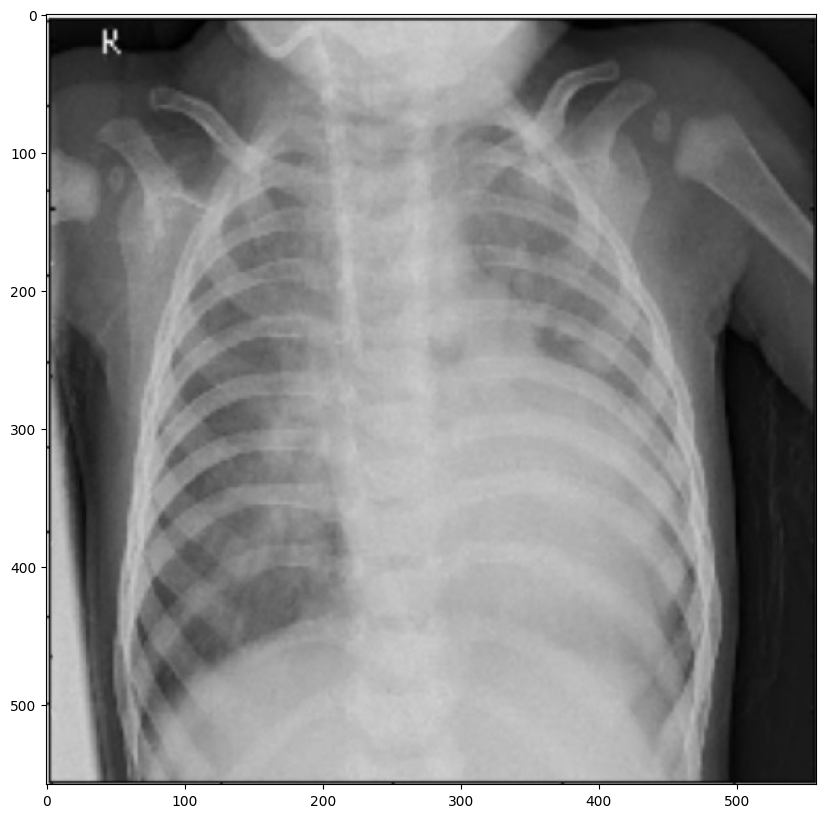

In [ ]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)
img_samp = cv2.imread(img_path)
plt.imshow(img_samp);

In [ ]:
prnt_out(x_img)

1/1 [==============================] - 1s 1s/step
Our network is 99.99% sure this is PNEUMONIA


In [ ]:
# Generate GradCAM heatmap
import tensorflow as tf
from keras.preprocessing import image
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array

def generate_grad_cam(model, img_path):
    img = load_img(img_path, target_size=(224, 224))
    img_tensor = img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor /= 255.

    pred_class = np.argmax(model.predict(img_tensor))

    last_conv_layer = model.get_layer("conv1")
    gradient_model = Model([model.inputs], [last_conv_layer.output, model.output])

    with tf.GradientTape() as tape:
        conv_output, predictions = gradient_model(img_tensor)
        loss = predictions[:, pred_class]

    grads = tape.gradient(loss, conv_output)[0]
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output_value = conv_output[0]
    heatmap = tf.reduce_mean(tf.multiply(conv_output_value, pooled_grads), axis=-1).numpy()
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    # heatmap = cv2.resize(heatmap, (224, 224))
    # heatmap = cv2.applyColorMap(np.uint8(heatmap*255), cv2.COLORMAP_JET)
    # heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    # heatmap = cv2.GaussianBlur(heatmap, (15, 15), 0)
    return heatmap

In [ ]:
import tensorflow as tf
import numpy as np

def generate_heatmap(model, img_array):
    # Get the index of the class predicted by the model
    predicted_class = tf.argmax(model.predict(img_array), axis=-1)

    # Get the last convolutional layer
    last_conv_layer = model.get_layer('conv1')

    # Create a function that returns the output of the last conv layer and the model's output
    grad_model = tf.keras.models.Model([model.inputs], [last_conv_layer.output, model.output])

    # Get the gradient of the predicted class with respect to the output of the last conv layer
    with tf.GradientTape() as tape:
        conv_output, predictions = grad_model(img_array)
        loss = predictions[:, predicted_class]

    grads = tape.gradient(loss, conv_output)[0]

    # Compute the weights using global average pooling
    weights = tf.reduce_mean(grads, axis=(0, 1))

    # Compute the weighted sum of the output of the last conv layer
    cam = np.dot(conv_output[0], weights)

    # Normalize the heatmap
    cam = cam - np.min(cam)
    cam = cam / np.max(cam)

    # Resize the heatmap to match the size of the input image
    cam = tf.image.resize(cam, (img_array.shape[1], img_array.shape[2]))

    return cam.numpy()


In [ ]:
image = cv2.imread("/content/pneumonia2.jpg")
resized_img = cv2.resize(image, (224, 224))
np_img = np.array(resized_img)
np_img = np_img/255
img_array = np.array([np_img])

In [ ]:
plt.rcParams['figure.figsize'] = (8.0, 8.0)
# heatmap = generate_grad_cam(model, "/content/pneumonia2.jpg")
heatmap = generate_heatmap(model, img_array)
plt.matshow(heatmap)
plt.show()

1/1 [==============================] - 0s 24ms/step


TypeError: ignored

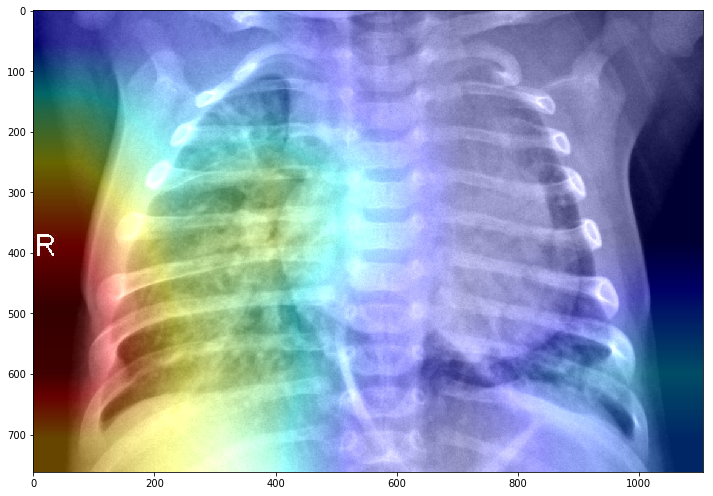

In [ ]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)
show_on_xray(img_path, heatmap)

In [ ]:
img_path = './chest_xray/test/PNEUMONIA/person100_bacteria_477.jpeg'
x_img = proc_img(img_path)
prnt_out(x_img)

Our network is 100.00% sure this is PNEUMONIA


Another Case of Pneumonia

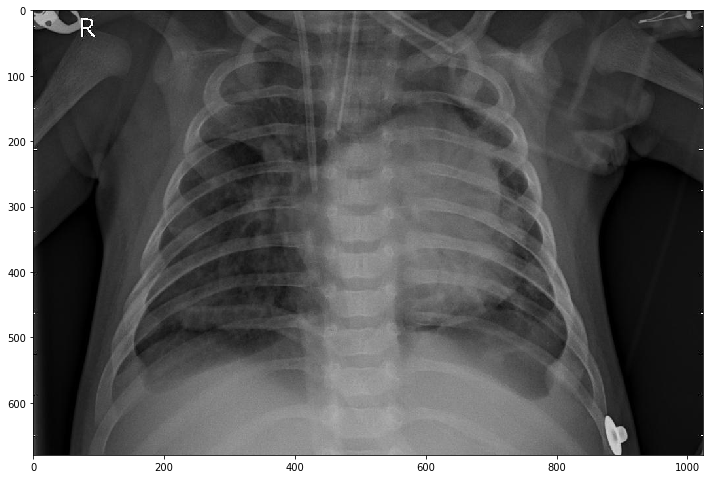

In [ ]:
img_samp_n = cv2.imread(img_path)
plt.imshow(img_samp_n);

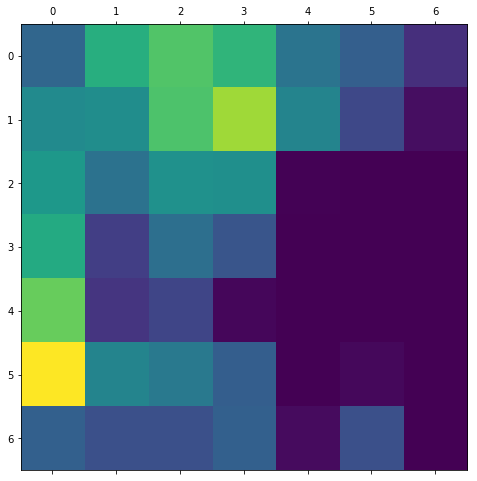

In [ ]:
plt.rcParams['figure.figsize'] = (8.0, 8.0)
heatmap = xray_CAM(x_img, blck, 1)
plt.matshow(heatmap)
plt.show()

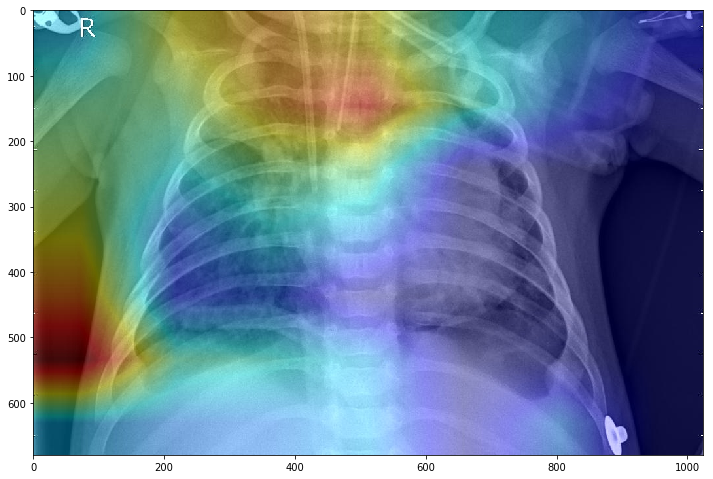

In [ ]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)
show_on_xray(img_path, heatmap)

### NORMAL

In [ ]:
img_path_n = '/content/normal.jpg'
#img_path = './chest_xray/val/NORMAL/NORMAL2-IM-1427-0001.jpeg'
#img_path = './chest_xray/val/NORMAL/NORMAL2-IM-1430-0001.jpeg'
x_img_n = proc_img(img_path_n)
prnt_out(x_img_n)

Our network is 99.99% sure this is NORMAL


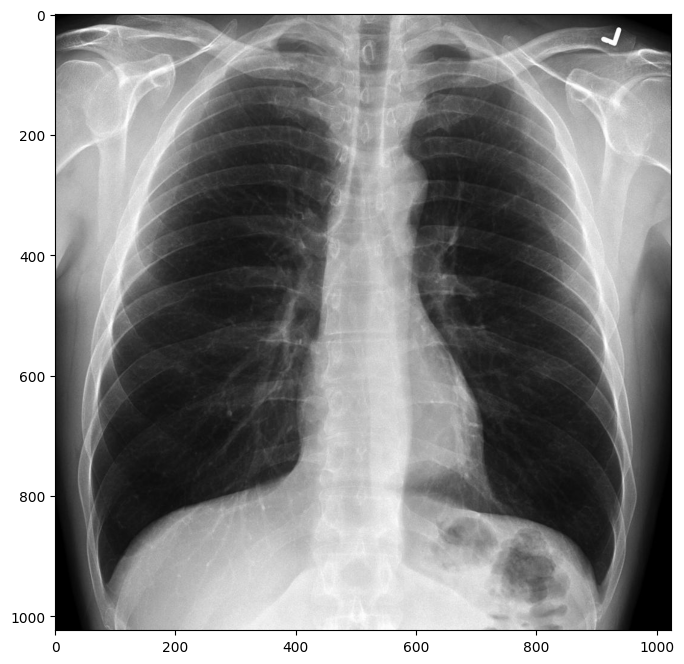

In [ ]:
img_samp_n = cv2.imread(img_path_n)
plt.imshow(img_samp_n);

In [ ]:
plt.rcParams['figure.figsize'] = (8.0, 8.0)
heatmap_n = xray_CAM(x_img_n, blck, 0)
plt.matshow(heatmap_n)
plt.show()

RecursionError: ignored

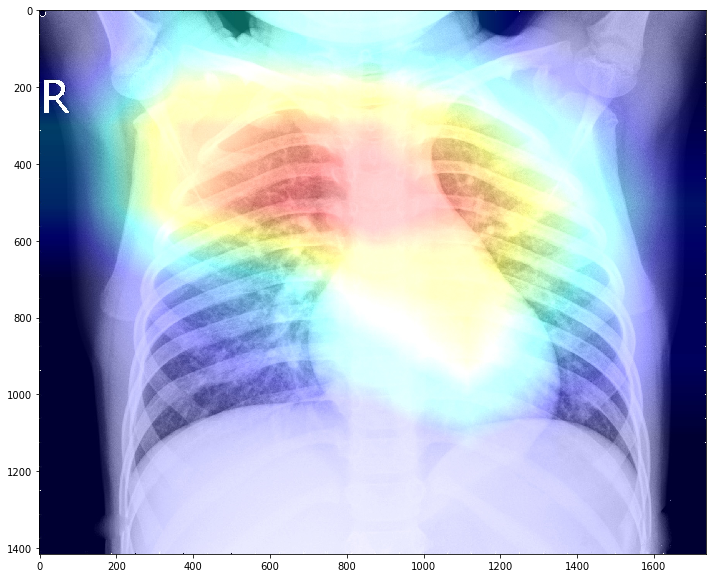

In [ ]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)
show_on_xray(img_path_n, heatmap_n)

In [ ]:
img_path_n = './chest_xray/test/NORMAL/IM-0003-0001.jpeg'
x_img_n = proc_img(img_path_n)
prnt_out(x_img_n)

Our network is 99.48% sure this is NORMAL


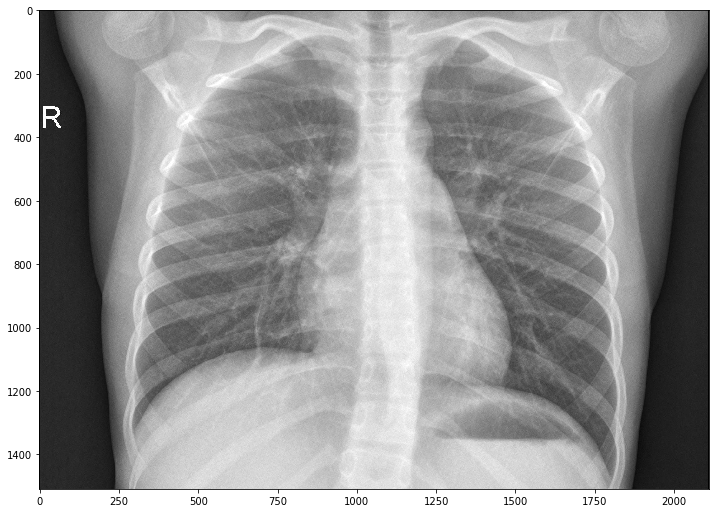

In [ ]:
img_samp_n = cv2.imread(img_path_n)
plt.imshow(img_samp_n);

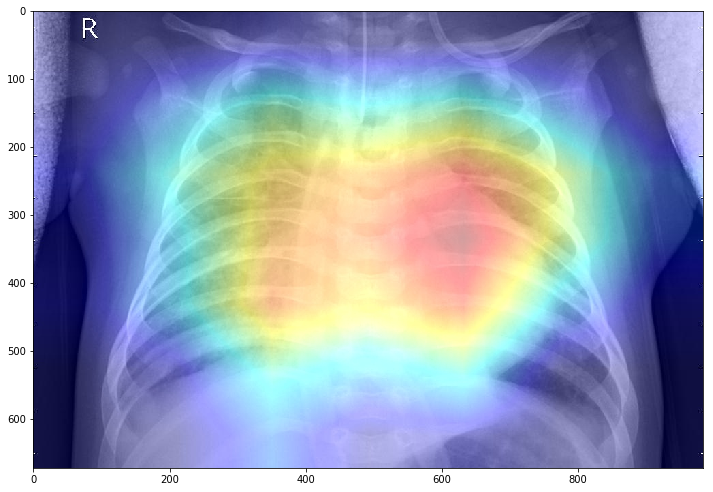

In [ ]:
heatmap = xray_CAM(x_img_n, blck, 0)
plt.rcParams['figure.figsize'] = (12.0, 10.0)
show_on_xray(img_path, heatmap)

# Display more unseen x-rays

In [ ]:
sample_path = Path('./chest_xray/val')

# Get the path to the normal and pneumonia sub-directories
normal_cases_dir = sample_path / 'NORMAL'
pneumonia_cases_dir = sample_path / 'PNEUMONIA'

# Get the list of all the images
normal_cases = normal_cases_dir.glob('*.jpeg')
pneumonia_cases = pneumonia_cases_dir.glob('*.jpeg')

# An empty list. We will insert the data into this list in (img_path, label) format
sample_data = []

# Go through all the normal cases. The label for these cases will be 0
for img in normal_cases:
    sample_data.append((img,0))

# Go through all the pneumonia cases. The label for these cases will be 1
for img in pneumonia_cases:
    sample_data.append((img, 1))

# Get a pandas dataframe from the data we have in our list
sample_data = pd.DataFrame(sample_data, columns=['image', 'label'], index=None)

# Shuffle the data
sample_data = sample_data.sample(frac=1.).reset_index(drop=True)

In [ ]:
sample_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 2 columns):
image    16 non-null object
label    16 non-null int64
dtypes: int64(1), object(1)
memory usage: 336.0+ bytes


In [ ]:
sample_data.head()

,image,label
0,chest_xray/val/PNEUMONIA/person1952_bacteria_4...,1
1,chest_xray/val/PNEUMONIA/person1951_bacteria_4...,1
2,chest_xray/val/PNEUMONIA/person1947_bacteria_4...,1
3,chest_xray/val/NORMAL/NORMAL2-IM-1430-0001.jpeg,0
4,chest_xray/val/NORMAL/NORMAL2-IM-1437-0001.jpeg,0


NORMAL


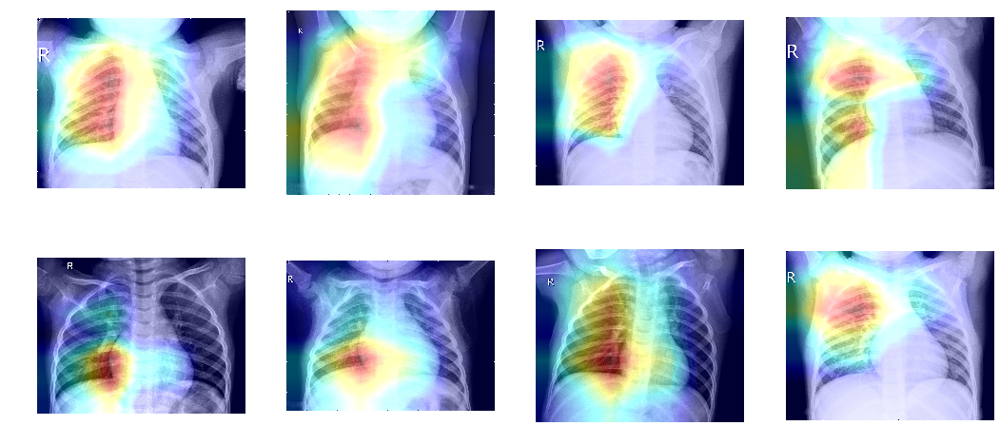

In [ ]:
print('NORMAL')
i_ = 0
plt.rcParams['figure.figsize'] = (18.0, 18.0)
plt.subplots_adjust(wspace=0.2, hspace=0)
for l in sample_data['image'][sample_data['label']==0]:
    #im = cv2.imread(l)
    #im = cv2.resize(im, (128, 128))
    plt.subplot(4, 4, i_+1) #.set_title(l)
    img_path = './'+np.str(l)
    x_im = proc_img(img_path)
    show_on_xray(img_path, xray_CAM(x_im, blck, 0)); #0=normal
    plt.axis('off')
    i_ += 1

PNEUMONIA


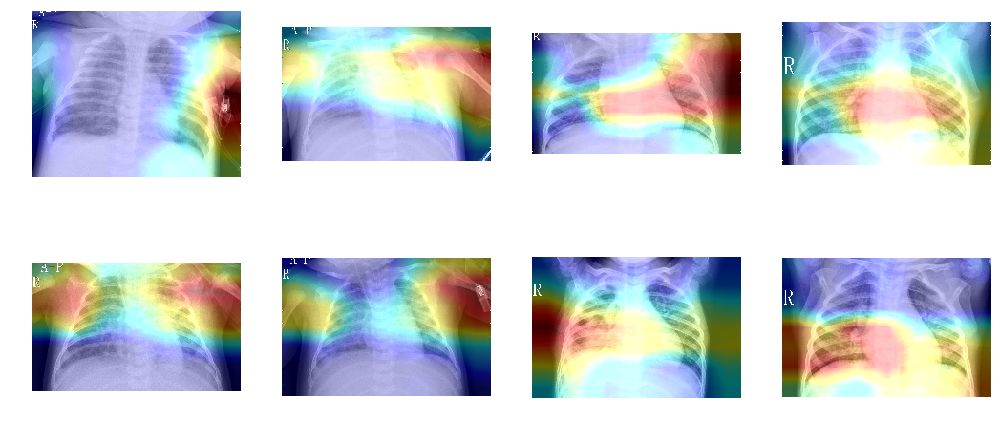

In [ ]:
print('PNEUMONIA')
i_ = 0
plt.rcParams['figure.figsize'] = (18.0, 18.0)
plt.subplots_adjust(wspace=0.2, hspace=0)
for l in sample_data['image'][sample_data['label']==1]:
    #im = cv2.imread(l)
    #im = cv2.resize(im, (128, 128))
    plt.subplot(4, 4, i_+1) #.set_title(l)
    img_path = './'+np.str(l)
    x_im = proc_img(img_path)
    show_on_xray(img_path, xray_CAM(x_im, blck, 1)); #1=pneumonia
    plt.axis('off')
    i_ += 1

PNEUMONIA


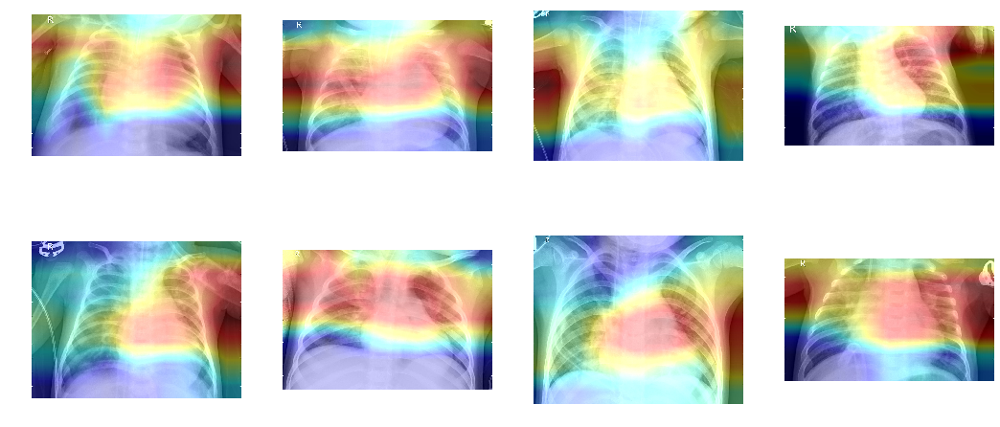

In [ ]:
print('PNEUMONIA')
i_ = 0
plt.rcParams['figure.figsize'] = (18.0, 18.0)
plt.subplots_adjust(wspace=0.2, hspace=0)
for l in test_data['image'][test_data['label']==1][:8]:
    plt.subplot(4, 4, i_+1) #.set_title(l)
    img_path = './'+np.str(l)
    x_im = proc_img(img_path)
    show_on_xray(img_path, xray_CAM(x_im, blck, 1)); #1=pneumonia
    plt.axis('off')
    i_ += 1

In [ ]:
from keras.models import load_model
model = load_model("/content/drive/MyDrive/IPD NOTES/grad_cam_model.h5")

In [ ]:
import numpy as np
import cv2

In [ ]:
def proc_img(img_path):
  "process the image"
  # `img` is a PIL image of size 224x224
  img = image.load_img(img_path, target_size=(224, 224))

  # `x` is a float32 Numpy array of shape (224, 224, 3)
  x_img = image.img_to_array(img)

  # We add a dimension to transform our array into a matrix
  # of size (1, 224, 224, 3)
  x_img = np.expand_dims(x_img, axis=0)

  # Finally we preprocess the batch
  # (this does channel-wise color normalization)
  #x_img = preprocess_input(x_img)
  x_img = preprocess_input(x_img)
  return x_img

In [ ]:
def prnt_out(x_img):
  "prints the probability that the model predict with its label"
  pred = model.predict(x_img)
  if pred[0,0] >= 0.5:
      print('Our network is {:.2%} sure this is NORMAL'.format(pred[0][0]))
  else:
      print('Our network is {:.2%} sure this is PNEUMONIA'.format(1-pred[0][0]))

In [ ]:
"""To visualize which parts of the image are the most important for the each
label for the classifier, let’s set up the Grad-CAM process."""



def get_img_array(img_path, size):
    img_arr = cv2.imread(img_path)
    img_arr = crop_brain_contour(img_arr, False)
    img_arr = cv2.resize(img_arr, (256, 256))
    img_arr = img_arr.reshape(1, 256, 256, 3)
    return img_arr


blck = 'conv_pw_13'  #MobileNet
#blck ='conv_pw_13_relu'
#blck = 'Conv_1'  #MobileNetV2
def xray_CAM(x_img, blck, label):
  "gives the CAM heatmap"
  #normal=0 and pneumonia=1

  # the prediction vector
  pred_output = model.output[:, label]

  # The is the output feature map of the `conv_pw_13` layer,
  # the last convolutional layer in MobileNet
  last_conv_layer = model.get_layer(blck)

  # This is the gradient of the image's class with regard to
  # the output feature map of `conv_pw_13`
  grads = K.gradients(pred_output, last_conv_layer.output)[0]

  # This is a vector of shape (512,), where each entry
  # is the mean intensity of the gradient over a specific feature map channel
  pooled_grads = K.mean(grads, axis=(0, 1, 2))

  # This function allows us to access the values of the quantities we just defined:
  # `pooled_grads` and the output feature map of `block5_conv3`,
  # given a sample image
  iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

  # These are the values of these two quantities, as Numpy arrays,
  # given our sample image of two elephants
  pooled_grads_value, conv_layer_output_value = iterate([x_img])

  # We multiply each channel in the feature map array
  # by "how important this channel is" with regard to the elephant class
  for i in range(1024): # we have 1024 features in our last conv layer
      conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

  # The channel-wise mean of the resulting feature map
  # is our heatmap of class activation
  heatmap = np.mean(conv_layer_output_value, axis=-1) # create a heatmap
  heatmap = np.maximum(heatmap, 0)  # remove negative values
  heatmap /= np.max(heatmap)  # normalize


  #!pip install tensorflow
import keras.utils as image
#from keras.preprocessing.image import img_to_array

def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = tf.keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = tf.keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

    # return heatmap

In [ ]:
def show_on_xray(img_path, heatmap):
  # We use cv2 to load the original image
  img = cv2.imread(img_path)

  # We resize the heatmap to have the same size as the original image
  heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

  # We convert the heatmap to RGB
  heatmap = np.uint8(255 * heatmap)

  # We apply the heatmap to the original image
  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

  # 0.4 here is a heatmap intensity factor
  superimposed_img = heatmap * 0.4 + img

  ## Save the image to disk
  cv2.imwrite('./xray_cam.jpg', superimposed_img)
  img_samp = cv2.imread('./xray_cam.jpg')  #OpenCV has BGR order
  img_samp = cv2.cvtColor(img_samp, cv2.COLOR_BGR2RGB)  #matplotlib has RGB order

  plt.imshow(img_samp)

In [ ]:
# The local path to our target image
#img_path = './chest_xray/val/PNEUMONIA/person1947_bacteria_4876.jpeg'
img_path ='/content/pneumonia2.jpg'

x_img = proc_img(img_path)

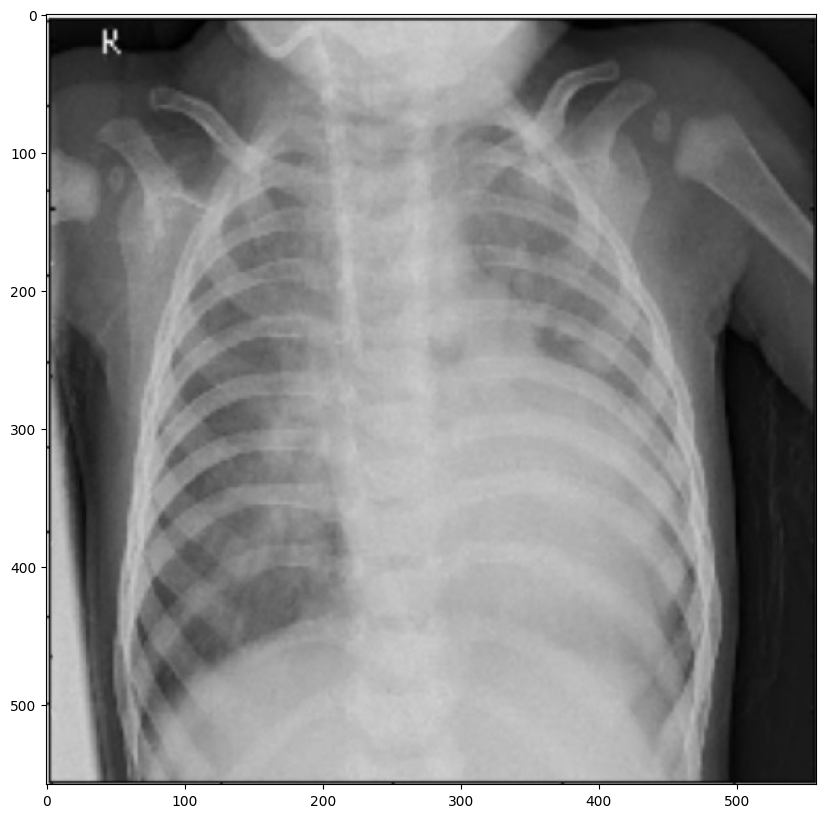

In [ ]:
plt.rcParams['figure.figsize'] = (12.0, 10.0)
img_samp = cv2.imread(img_path)
plt.imshow(img_samp);